In [1]:
%load_ext autoreload
%autoreload 2

In [7]:
from collections import defaultdict
import datetime
import json
import matplotlib.pyplot as plt
import numpy as np
from numpy.random import default_rng
import os
import pandas as pd
import pickle
import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
import pyalex
from pyalex import Authors, Concepts, Institutions, Works
from scipy.stats import mannwhitneyu
import seaborn as sns
from tqdm.notebook import tqdm
import xarray as xr

from research_impact.bootstrap import bootstrap_wrapper, propagate_bootstrap_list, propagate_bootstrap_dict, bootstrap_stats
from research_impact.citations import get_bounded_citations
from research_impact.processors import OpenAlexProcessor
from research_impact.regression import fit_linear_regression, predict
from research_impact.utils import dict_to_dataarray
from research_impact.plotting import save_plot
from research_impact.pyalex_utils import merge_pages, merge_sample

In [3]:
CITATION_YEAR_BOUND = 3

In [5]:
# Location to save data
data_file_location = 'data/publications/'
os.makedirs(data_file_location, exist_ok=True)

# Load dataset

In [8]:
works = []
with open(data_file_location + "selected_institution_works_openalex_deduplicated_extra_openai_2023-11-01_12-03-19.jsonl", "rb") as f:
    for line in f:
        works.append(json.loads(line))

In [9]:
selected_institution_ids = []
with open(data_file_location + "selected_institution_ids_2023-11-01_12-03-19.jsonl", "rb") as f:
    for line in f:
        selected_institution_ids.append(json.loads(line))

In [10]:
institution_aliases = {}
with open(data_file_location + "institution_aliases_2023-11-01_12-03-19.jsonl", "rb") as f:
    for line in f:
        institution_aliases.update(json.loads(line))

In [11]:
len(works)

66175

In [12]:
works[0]

{'id': 'https://openalex.org/W2919115771',
 'doi': 'https://doi.org/10.1038/nature14539',
 'title': 'Deep learning',
 'display_name': 'Deep learning',
 'publication_year': 2015,
 'publication_date': '2015-05-27',
 'ids': {'openalex': 'https://openalex.org/W2919115771',
  'doi': 'https://doi.org/10.1038/nature14539',
  'mag': '2919115771',
  'pmid': 'https://pubmed.ncbi.nlm.nih.gov/26017442'},
 'language': 'en',
 'primary_location': {'is_oa': False,
  'landing_page_url': 'https://doi.org/10.1038/nature14539',
  'pdf_url': None,
  'source': {'id': 'https://openalex.org/S137773608',
   'display_name': 'Nature',
   'issn_l': '0028-0836',
   'issn': ['1476-4687', '0028-0836'],
   'is_oa': False,
   'is_in_doaj': False,
   'host_organization': 'https://openalex.org/P4310319908',
   'host_organization_name': 'Nature Portfolio',
   'host_organization_lineage': ['https://openalex.org/P4310319908',
    'https://openalex.org/P4310319965'],
   'host_organization_lineage_names': ['Nature Portfolio'

In [13]:
selected_institution_ids

['https://openalex.org/I1291425158',
 'https://openalex.org/I4210113297',
 'https://openalex.org/I4210100430',
 'https://openalex.org/I4210148186',
 'https://openalex.org/I4210117425',
 'https://openalex.org/I4210131802',
 'https://openalex.org/I4210090411',
 'https://openalex.org/I2252078561',
 'https://openalex.org/I4210114444',
 'https://openalex.org/I4210111288',
 'https://openalex.org/I1290206253',
 'https://openalex.org/I4210164937',
 'https://openalex.org/I4210113369',
 'https://openalex.org/I4210124949',
 'https://openalex.org/I4210105678',
 'https://openalex.org/I4210087053',
 'https://openalex.org/I4210125051',
 'https://openalex.org/I4210162141',
 'https://openalex.org/I4210086099',
 'https://openalex.org/I4210153468',
 'https://openalex.org/I4210161634',
 'https://openalex.org/I4210110431',
 'https://openalex.org/I4210099966',
 'https://openalex.org/I4210108625',
 'https://openalex.org/I4210135422',
 'https://openalex.org/I4210139986',
 'https://openalex.org/I4210109507',
 

In [14]:
institution_aliases

{'https://openalex.org/I1291425158': 'Google',
 'https://openalex.org/I4210113297': 'Google',
 'https://openalex.org/I4210100430': 'Google',
 'https://openalex.org/I4210148186': 'Google',
 'https://openalex.org/I4210117425': 'Google',
 'https://openalex.org/I4210131802': 'Google',
 'https://openalex.org/I4210090411': 'DeepMind',
 'https://openalex.org/I2252078561': 'Meta',
 'https://openalex.org/I4210114444': 'Meta',
 'https://openalex.org/I4210111288': 'Meta',
 'https://openalex.org/I1290206253': 'Microsoft',
 'https://openalex.org/I4210164937': 'Microsoft',
 'https://openalex.org/I4210113369': 'Microsoft',
 'https://openalex.org/I4210124949': 'Microsoft',
 'https://openalex.org/I4210105678': 'Microsoft',
 'https://openalex.org/I4210087053': 'Microsoft',
 'https://openalex.org/I4210125051': 'Microsoft',
 'https://openalex.org/I4210162141': 'Microsoft',
 'https://openalex.org/I4210086099': 'Microsoft',
 'https://openalex.org/I4210153468': 'Microsoft',
 'https://openalex.org/I4210161634

# Statistical significance

In [151]:
processor = OpenAlexProcessor(works, selected_institution_ids, institution_aliases, citation_year_bound=CITATION_YEAR_BOUND)
processor.process_works()

In [152]:
institution_individual_citations = processor.get_individual_bounded_citations()

In [154]:
for k, v in sorted(institution_individual_citations.items(), key=lambda x: np.mean(x[1]), reverse=True):
    print(k, np.mean(v))

Quansight 6808.333333333333
Enthought 1770.3333333333333
OpenAI 153.20731707317074
DeepMind 91.3682119205298
Meta 56.33914088314809
Google 43.36305101535414
Group Sense 40.59084194977844
Uber 31.40948275862069
Twitter 31.40548780487805
Nvidia 30.762755102040817
Naver 23.32075471698113
Microsoft 23.10701030927835
Adobe 23.092077087794433
Baidu 18.891666666666666
Salesforce 18.578199052132703
Tencent 16.056938483547924
Yandex 14.34959349593496
Amazon 13.60769750168805
Netflix 12.564705882352941
Alibaba 12.111857476635514
Intel 11.713271103896103
Xerox 11.691729323308271
IBM 10.792873279934279
Huawei 10.694357976653697
NEC 8.998475609756097


In [155]:
for k, v in sorted(institution_individual_citations.items(), key=lambda x: np.median(x[1]), reverse=True):
    print(k, np.median(v))

Quansight 7530.0
OpenAI 40.5
Enthought 13.5
DeepMind 9.0
Meta 7.0
Group Sense 7.0
Google 6.0
Adobe 6.0
Twitter 6.0
Uber 6.0
Microsoft 5.0
Netflix 5.0
IBM 3.0
Salesforce 3.0
Baidu 3.0
Nvidia 3.0
Tencent 3.0
Alibaba 3.0
Amazon 2.0
Intel 2.0
Huawei 2.0
Yandex 2.0
Naver 2.0
Xerox 2.0
NEC 1.0


In [156]:
for k, v in sorted(institution_individual_citations.items(), key=lambda x: np.sum(x[1]), reverse=True):
    print(k, np.sum(v))

Google 437750
Microsoft 336207
Meta 187553
IBM 105101
DeepMind 68983
Intel 57723
Tencent 56119
Huawei 54969
Adobe 53920
Nvidia 48236
Alibaba 41471
Amazon 40306
Baidu 36272
Group Sense 27480
OpenAI 25126
Enthought 21244
Quansight 20425
Naver 13596
NEC 11806
Twitter 10301
Uber 7287
Xerox 6220
Salesforce 3920
Yandex 3530
Netflix 2136


In [159]:
# Perform the Mann-Whitney U test
ins1 = 'Google'
ins2 = 'Microsoft'
array1 = np.copy(institution_individual_citations[ins1])
array2 = np.copy(institution_individual_citations[ins2])
u_statistic, p_value = mannwhitneyu(array1, array2)

print(f"{ins1}: sample_size={len(array1)}, mean={np.mean(array1):.2f}, median={np.median(array1):.2f}")
print(f"{ins2}: sample_size={len(array2)}, mean={np.mean(array2):.2f}, median={np.median(array2):.2f}")
print("U statistic:", u_statistic)
print("Common language effect size:", u_statistic / (len(array1) * len(array2)))
print("P-value:", p_value)

Google: sample_size=10095, mean=43.36, median=6.00
Microsoft: sample_size=14550, mean=23.11, median=5.00
U statistic: 77637855.5
Common language effect size: 0.5285720738891186
P-value: 1.5935126077562757e-14


# Sample of papers

In [20]:
for work in works[:10]:
    has_affiliation = False
    for authorship in work['authorships']:
        if len(authorship['institutions']) > 0:
            has_affiliation = True
    if has_affiliation:
        authors = [authorship['author']['display_name'] for authorship in work['authorships']]
        institutions = [[ins['display_name'] for ins in authorship['institutions']] for authorship in work['authorships']]
        authors_institutions = []
        for auth, inss in zip(authors, institutions):
            if len(inss) == 0:
                authors_institutions.append(f"{auth} - [unknown]")
            else:
                authors_institutions.append(f"{auth} - {', '.join(inss)}")
        
        print(f"\"{work['title']}\"")
        for auth_ins in authors_institutions:
            print(f"    {auth_ins}")
        print()

"Deep learning"
    Yann LeCun - Meta (United States), New York University
    Yoshua Bengio - Université de Montréal
    Geoffrey E. Hinton - Google (United States), University of Toronto

"Going deeper with convolutions"
    Christian Szegedy - Google (United States)
    Wei Liu - University of North Carolina at Chapel Hill
    Yangqing Jia - Google (United States)
    Pierre Sermanet - Google (United States)
    Scott Reed - University of Michigan–Ann Arbor
    Dragomir Anguelov - Google (United States)
    Dumitru Erhan - Google (United States)
    Vincent Vanhoucke - Google (United States)
    Andrew Rabinovich - Magic Leap (United States)

"ImageNet classification with deep convolutional neural networks"
    Alex Krizhevsky - Google (United States)
    Ilya Sutskever - Google (United States)
    Geoffrey E. Hinton - OpenAI (United States)

"Attention is All you Need"
    Ashish Vaswani - Google (United States)
    Noam Shazeer - Google (United States)
    Niki Parmar - University

In [21]:
# Create a random number generator, with a fixed random seed for reproducibility
SEED = 20230105
rng = default_rng(seed=SEED)

for work in rng.choice(works, size=100):
    has_affiliation = False
    for authorship in work['authorships']:
        if len(authorship['institutions']) > 0:
            has_affiliation = True
    if has_affiliation:
        authors = [authorship['author']['display_name'] for authorship in work['authorships']]
        institutions = [[ins['display_name'] for ins in authorship['institutions']] for authorship in work['authorships']]
        authors_institutions = []
        for auth, inss in zip(authors, institutions):
            if len(inss) == 0:
                authors_institutions.append(f"{auth} - [unknown]")
            else:
                authors_institutions.append(f"{auth} - {', '.join(inss)}")
        
        print(f"\"{work['title']}\"")
        for auth_ins in authors_institutions:
            print(f"    {auth_ins}")
        print()


"Closed-Loop DPD with Dynamic Resource Block Scheduling"
    Peter Pawliuk - Intel (United States)
    Benjamin Jann - Intel (United States)

"Vamsa: Automated Provenance Tracking in Data Science Scripts"
    Mohammad Hossein Namaki - Washington State University
    Avrilia Floratou - Microsoft (United States)
    Fotis Psallidas - Microsoft (United States)
    Subru Krishnan - Microsoft (United States)
    Ashvin Agrawal - Microsoft (United States)
    Yinghui Wu - Case Western Reserve University
    Yiwen Zhu - Microsoft (United States)
    Markus Weimer - Microsoft (United States)

"The basics of natural language processing"
    Chenguang Zhu - Microsoft (United States)

"Is this Change the Answer to that Problem?"
    Haoye Tian - University of Luxembourg
    Tang, Xunzhu - University of Luxembourg
    Andrew Habib - University of Luxembourg
    Shangwen Wang - National University of Defense Technology
    Kui Liu - Huawei Technologies (China)
    Xin Xia - Huawei Technologies (Chi

# Sense checks

We had not heard of Quansight or Enthought before - what are they known for?

In [22]:
quansight_id = 'https://openalex.org/I4210098317'
enthought_id = 'https://openalex.org/I4210121859'

In [23]:
Works().filter(authorships={"institutions": {"id": quansight_id}}).get()

[{'id': 'https://openalex.org/W3103145119',
  'doi': 'https://doi.org/10.1038/s41592-019-0686-2',
  'title': 'SciPy 1.0: fundamental algorithms for scientific computing in Python',
  'display_name': 'SciPy 1.0: fundamental algorithms for scientific computing in Python',
  'publication_year': 2020,
  'publication_date': '2020-02-03',
  'ids': {'openalex': 'https://openalex.org/W3103145119',
   'doi': 'https://doi.org/10.1038/s41592-019-0686-2',
   'mag': '3103145119'},
  'language': 'en',
  'primary_location': {'is_oa': True,
   'landing_page_url': 'https://doi.org/10.1038/s41592-019-0686-2',
   'pdf_url': 'https://www.nature.com/articles/s41592-019-0686-2.pdf',
   'source': {'id': 'https://openalex.org/S127827428',
    'display_name': 'Nature Methods',
    'issn_l': '1548-7091',
    'issn': ['1548-7105', '1548-7091'],
    'is_oa': False,
    'is_in_doaj': False,
    'host_organization': 'https://openalex.org/P4310319908',
    'host_organization_name': 'Nature Portfolio',
    'host_orga

In [24]:
Works().filter(authorships={"institutions": {"id": enthought_id}}).get()

[{'id': 'https://openalex.org/W3103145119',
  'doi': 'https://doi.org/10.1038/s41592-019-0686-2',
  'title': 'SciPy 1.0: fundamental algorithms for scientific computing in Python',
  'display_name': 'SciPy 1.0: fundamental algorithms for scientific computing in Python',
  'publication_year': 2020,
  'publication_date': '2020-02-03',
  'ids': {'openalex': 'https://openalex.org/W3103145119',
   'doi': 'https://doi.org/10.1038/s41592-019-0686-2',
   'mag': '3103145119'},
  'language': 'en',
  'primary_location': {'is_oa': True,
   'landing_page_url': 'https://doi.org/10.1038/s41592-019-0686-2',
   'pdf_url': 'https://www.nature.com/articles/s41592-019-0686-2.pdf',
   'source': {'id': 'https://openalex.org/S127827428',
    'display_name': 'Nature Methods',
    'issn_l': '1548-7091',
    'issn': ['1548-7105', '1548-7091'],
    'is_oa': False,
    'is_in_doaj': False,
    'host_organization': 'https://openalex.org/P4310319908',
    'host_organization_name': 'Nature Portfolio',
    'host_orga

What is Group Sense?

In [25]:
group_sense_id = 'https://openalex.org/I4210128910'
group_sense_works = merge_pages(
    Works() \
        .filter(authorships={"institutions": {"id": group_sense_id}}) \
        .filter(concepts={"id": 'https://openalex.org/C154945302|https://openalex.org/C119857082'}) \
        .filter(from_publication_date="2010-01-01") \
        .filter(to_publication_date="2023-06-01") \
        .paginate(per_page=200, n_max=int(1e6))        
)
print(len(group_sense_works), 'works')

for work in group_sense_works[:25]:
    print(work['title'])
    for authorship in work['authorships']:
        if group_sense_id in [ins['id'] for ins in authorship['institutions']]:
            print(authorship['raw_affiliation_string'])
    print()

5page [00:08,  1.74s/page]

808 works
Pyramid Scene Parsing Network
[Sensetime Group Limited]

Residual Attention Network for Image Classification
[Sensetime Group Limited]
[Sensetime Group Limited]
[Sensetime Group Limited]

High Performance Visual Tracking with Siamese Region Proposal Network
[Sensetime Group Limited]

DeepFashion: Powering Robust Clothes Recognition and Retrieval with Rich Annotations
[Sensetime Group Limited]

Context Encoding for Semantic Segmentation
[SenseTime]

Libra R-CNN: Towards Balanced Learning for Object Detection
[Sensetime Group Limited]

GeoNet: Unsupervised Learning of Dense Depth, Optical Flow and Camera Pose
[Sense Time Research]
[Sense Time Research]

NTIRE 2017 Challenge on Single Image Super-Resolution: Methods and Results
SenseTime
SenseTime

Distractor-Aware Siamese Networks for Visual Object Tracking
SenseTime Group Limited, Beijing, China
SenseTime Group Limited, Beijing, China
SenseTime Group Limited, Beijing, China

ICNet for Real-Time Semantic Segmentation on High-Re

In [26]:
sensetime_count = 0
for work in group_sense_works:
    for authorship in work['authorships']:
        if group_sense_id in [ins['id'] for ins in authorship['institutions']]:
            raw_affiliation_string = authorship['raw_affiliation_string']
            if 'sensetime' in raw_affiliation_string.lower() or 'sense time' in raw_affiliation_string.lower():
                sensetime_count += 1
                break
sensetime_count / len(group_sense_works)

0.9752475247524752

In [27]:
Institutions().search('Sense').get()

[{'id': 'https://openalex.org/I4210128910',
  'ror': 'https://ror.org/036wd5777',
  'display_name': 'Group Sense (China)',
  'relevance_score': 9980.91,
  'country_code': 'CN',
  'type': 'company',
  'lineage': ['https://openalex.org/I4210128910'],
  'homepage_url': 'http://www.gsl.com.hk/',
  'image_url': None,
  'image_thumbnail_url': None,
  'display_name_acronyms': ['GSL'],
  'display_name_alternatives': [],
  'repositories': [],
  'works_count': 1006,
  'cited_by_count': 47359,
  'summary_stats': {'2yr_mean_citedness': 8.174193548387096,
   'h_index': 96,
   'i10_index': 382},
  'ids': {'openalex': 'https://openalex.org/I4210128910',
   'ror': 'https://ror.org/036wd5777',
   'grid': 'grid.493556.8'},
  'geo': {'city': 'Hong Kong',
   'geonames_city_id': '1819729',
   'region': None,
   'country_code': 'CN',
   'country': 'China',
   'latitude': 22.330235,
   'longitude': 114.19292},
  'international': {'display_name': {'en': 'Group Sense (China)'}},
  'associated_institutions': []

Checking what some well-known papers look like and how accurate the authorship is

In [110]:
name_to_id = defaultdict(list)
for institution_id, institution_name in institution_aliases.items():
    name_to_id[institution_name].append(institution_id)

institution_keywords = {
    'Adobe': ['adobe'],
    'Alibaba': ['alibaba', 'alipay', 'ablibaba'],
    'Amazon': ['amazon'],
    'Baidu': ['baidu'],
    'DeepMind': ['deepmind', 'deep mind'],
    'Google': ['google'],
    'Group Sense': ['sensetime', 'sense time', 'sense\'time', 'sense-time'],
    'Huawei': ['huawei'],
    'IBM': ['ibm', 'international business machines'],
    'Intel': ['intel'],
    'NEC': ['nec', 'nippon electric company'],
    'Naver': ['naver'],
    'Netflix': ['netflix'],
    'Nvidia': ['nvidia'],
    'Meta': ['facebook', 'meta'],
    'Microsoft': ['microsoft'],
    'OpenAI': ['openai', 'open ai'],
    'Salesforce': ['salesforce', 'sales force'],
    'Tencent': ['tencent'],
    'Twitter': ['twitter'],
    'Uber': ['uber'],
    'Xerox': ['xerox'],
    'Yandex': ['yandex'],
    'Enthought': ['enthought'],
    'Quansight': ['quansight'],
}

raw_affiliation_fractions = {}

def get_institution_works(institution_ids):
    institution_works = []
    for institution_id in institution_ids:
        institution_works.extend(
            merge_pages(
                Works() \
                    .filter(authorships={"institutions": {"id": institution_id}}) \
                    .filter(concepts={"id": 'https://openalex.org/C154945302|https://openalex.org/C119857082'}) \
                    .filter(from_publication_date="2010-01-01") \
                    .filter(to_publication_date="2023-06-01") \
                    .paginate(per_page=200, n_max=int(1e6)) 
            )
        )
    unique_titles = set()
    unique_works = []
    for work in institution_works:
        title = work['display_name']
        if title is not None:
            title = title.lower()
            for char in title:
                if not char.isalnum():
                    title = title.replace(char, '')
            if title not in unique_titles:
                unique_titles.add(title)
                unique_works.append(work)
    institution_works = unique_works
    return institution_works

def get_raw_affiliation_count(institution_name, institution_ids, institution_works):
    raw_affiliation_count = 0
    raw_affiliation_keywords = institution_keywords[institution_name]
    print(f'Raw affiliation keywords: {raw_affiliation_keywords}')
    for work in institution_works:
        raw_affiliation_found = False
        for authorship in work['authorships']:
            author_institution_ids = [ins['id'] for ins in authorship['institutions']]
            if any([institution_id in author_institution_ids for institution_id in institution_ids]):
                raw_affiliation_string = authorship['raw_affiliation_string']
                if any([keyword in raw_affiliation_string.lower() for keyword in raw_affiliation_keywords]):
                    raw_affiliation_count += 1
                    raw_affiliation_found = True
            if raw_affiliation_found:
                break
        # if not raw_affiliation_found:
        #     raw_strings = [authorship["raw_affiliation_string"] for authorship in work["authorships"]]
        #     print(f'No raw affiliation match: {work["id"]} {raw_strings}')
    return raw_affiliation_count

for institution_name in institution_keywords.keys():
    print(f'==== {institution_name} ====')
    institution_ids = name_to_id[institution_name]
    institution_works = get_institution_works(institution_ids)
    raw_affiliation_count = get_raw_affiliation_count(institution_name, institution_ids, institution_works)
    raw_affiliation_fractions[institution_name] = raw_affiliation_count / len(institution_works)
    print()
    print(f'Works: {len(institution_works)}')
    print(f'Raw affiliation match: {raw_affiliation_count}')
    print(f'No raw affiliation match: {len(institution_works) - raw_affiliation_count}')
    print(f'Raw affiliation match fraction: {raw_affiliation_count / len(institution_works):.3f}')
    print()

==== Microsoft ====


45page [01:40,  2.23s/page]
21page [00:50,  2.41s/page]
18page [00:52,  2.94s/page]
4page [00:09,  2.31s/page]
1page [00:02,  2.97s/page]
1page [00:01,  1.88s/page]
1page [00:01,  1.93s/page]
1page [00:02,  2.50s/page]
1page [00:01,  1.79s/page]
1page [00:01,  1.70s/page]
1page [00:01,  1.45s/page]
1page [00:01,  1.02s/page]
1page [00:01,  1.17s/page]
1page [00:01,  1.58s/page]
1page [00:01,  1.46s/page]
1page [00:01,  1.52s/page]
1page [00:01,  1.28s/page]
1page [00:01,  1.37s/page]
1page [00:01,  1.07s/page]


Raw affiliation keywords: ['microsoft']
No raw affiliation match: https://openalex.org/W2470673105 ['', '', '', '', '', '']
No raw affiliation match: https://openalex.org/W1524333225 ['', '', '', '', '', '', '', '', '', '', '', '', '']
No raw affiliation match: https://openalex.org/W2141599568 ['', '', '']
No raw affiliation match: https://openalex.org/W2963206148 ['', '', '', '', '']
No raw affiliation match: https://openalex.org/W2951548327 ['']
No raw affiliation match: https://openalex.org/W2407521645 ['', '', '', '']
No raw affiliation match: https://openalex.org/W2599765304 ['', '', '', '']
No raw affiliation match: https://openalex.org/W2950898568 ['', '', '', '']
No raw affiliation match: https://openalex.org/W2963168371 ['', '', '']
No raw affiliation match: https://openalex.org/W2740747242 ['', '', '', '', '']
No raw affiliation match: https://openalex.org/W2407022425 ['', '', '', '', '']
No raw affiliation match: https://openalex.org/W2971274815 ['', '', '', '', '', '', '', 

In [96]:
raw_affiliation_fractions

{'Adobe': 0.8805474906677727,
 'Alibaba': 0.9272624753312658,
 'Amazon': 0.8445901639344262,
 'Baidu': 0.8728943338437979,
 'DeepMind': 0.9824561403508771,
 'Google': 0.8185350689722168,
 'Group Sense': 0.9786931818181818,
 'Huawei': 0.9106606606606606,
 'IBM': 0.8880985774393909,
 'Intel': 0.9620328257860391,
 'NEC': 0.9565217391304348,
 'Naver': 0.8396694214876033,
 'Netflix': 0.9265536723163842,
 'Nvidia': 0.9189526184538653,
 'Meta': 0.8218934911242604,
 'Microsoft': 0.8883103010881901,
 'OpenAI': 1.0,
 'Salesforce': 1.0,
 'Tencent': 0.897364771151179,
 'Twitter': 0.9449275362318841,
 'Uber': 0.782051282051282,
 'Xerox': 0.8087954110898662,
 'Yandex': 0.8862745098039215,
 'Enthought': 1.0,
 'Quansight': 1.0}

In [98]:
1 - sum(raw_affiliation_fractions.values()) / len(raw_affiliation_fractions)

0.09051657309065997

In [99]:
1 - min(raw_affiliation_fractions.values())

0.21794871794871795

In [ ]:
institution_negative_keywords = {
    'Alibaba': [],  # unfinished
    'Amazon': ['Amazônia'],
    'Baidu': ['Baifendian', 'Baihe', 'Baiyining', 'Baihu', 'BAI YongQiang', 'Baihui', 'Baixing', 'Baiwang', ],  # unfinished
    'DeepMind': ['AdeptMind', 'Secondmind', 'VivoMind', 'InMind', 'Vastmindz', 'Nethermind', 'Medmind'],
    'Group Sense': ['SenseNets', 'Sense Cost', 'Sensel', 'SENSE', 'TECH/SENSE', 'GoodNotes', 'Senseg', 'Pollen Sense', 'We-Sense', 'SensEcho', 'Sense Future', 'SENSeOR' ],
    'Meta': ['Go Meta', 'GE Intelligent Platforms'],
    'OpenAI': ['Norwegian Open AI Lab'],  # unfinished
    'Yandex': ['Yanfang', 'Yanshan', 'Yanda'],
}

False negatives

In [128]:
institution_works = get_institution_works(name_to_id['OpenAI'])
institution_works_raw_search = merge_pages(
    Works() \
        .filter(raw_affiliation_string={'search': 'openai|open ai'}) \
        .filter(concepts={"id": 'https://openalex.org/C154945302|https://openalex.org/C119857082'}) \
        .filter(from_publication_date="2010-01-01") \
        .filter(to_publication_date="2023-06-01") \
        .paginate(per_page=200, n_max=int(1e6))        
)

1page [00:01,  1.95s/page]
2page [00:03,  1.95s/page]


In [130]:
[work['title'] for work in institution_works_raw_search]

['ImageNet classification with deep convolutional neural networks',
 'Deep Learning with Differential Privacy',
 'Domain randomization for transferring deep neural networks from simulation to the real world',
 'Practical Black-Box Attacks against Machine Learning',
 'Learning Transferable Visual Models From Natural Language Supervision',
 'Model-agnostic meta-learning for fast adaptation of deep networks',
 'InfoGAN: interpretable representation learning by information maximizing generative adversarial nets',
 'Learning dexterous in-hand manipulation',
 'Sim-to-Real Transfer of Robotic Control with Dynamics Randomization',
 'Generative Adversarial Imitation Learning',
 'Weight normalization: a simple reparameterization to accelerate training of deep neural networks',
 'Overcoming Exploration in Reinforcement Learning with Demonstrations',
 'InfoGAN: Interpretable Representation Learning by Information Maximizing Generative Adversarial Nets',
 'Scaling Laws for Neural Language Models',


In [126]:
institution_works_ids = set([work['id'] for work in institution_works])
institution_works_raw_search_ids = set([work['id'] for work in institution_works_raw_search])

In [ ]:
for work_id in (institution_works_raw_search_ids - institution_works_ids):
    print(Works()[work_id]['title'])

In [108]:
print(len(institution_works_raw_search_ids.symmetric_difference(institution_works_ids)))

157


In [127]:
len(institution_works_raw_search_ids), len(institution_works_ids)

(1182, 801)

In [ ]:
Works().search("Attention is all you need").get()

[{'id': 'https://openalex.org/W2963403868',
  'doi': None,
  'title': 'Attention is All you Need',
  'display_name': 'Attention is All you Need',
  'relevance_score': 19693.951,
  'publication_year': 2017,
  'publication_date': '2017-06-12',
  'ids': {'openalex': 'https://openalex.org/W2963403868', 'mag': '2963403868'},
  'language': 'en',
  'primary_location': {'is_oa': False,
   'landing_page_url': 'https://arxiv.org/pdf/1706.03762v5',
   'pdf_url': None,
   'source': {'id': 'https://openalex.org/S4306400194',
    'display_name': 'arXiv (Cornell University)',
    'issn_l': None,
    'issn': None,
    'is_oa': True,
    'is_in_doaj': False,
    'host_organization': 'https://openalex.org/I205783295',
    'host_organization_name': 'Cornell University',
    'host_organization_lineage': ['https://openalex.org/I205783295'],
    'host_organization_lineage_names': ['Cornell University'],
    'type': 'repository'},
   'license': None,
   'version': None,
   'is_accepted': False,
   'is_publis

In [ ]:
Works().search("Language models are few-shot learners").get()[0]

{'id': 'https://openalex.org/W3030163527',
 'doi': None,
 'title': 'Language Models are Few-Shot Learners',
 'display_name': 'Language Models are Few-Shot Learners',
 'relevance_score': 6745.986,
 'publication_year': 2020,
 'publication_date': '2020-05-28',
 'ids': {'openalex': 'https://openalex.org/W3030163527', 'mag': '3030163527'},
 'language': 'en',
 'primary_location': {'is_oa': False,
  'landing_page_url': 'https://arxiv.org/pdf/2005.14165.pdf',
  'pdf_url': None,
  'source': {'id': 'https://openalex.org/S4306400194',
   'display_name': 'arXiv (Cornell University)',
   'issn_l': None,
   'issn': None,
   'is_oa': True,
   'is_in_doaj': False,
   'host_organization': 'https://openalex.org/I205783295',
   'host_organization_name': 'Cornell University',
   'host_organization_lineage': ['https://openalex.org/I205783295'],
   'host_organization_lineage_names': ['Cornell University'],
   'type': 'repository'},
  'license': None,
  'version': 'submittedVersion',
  'is_accepted': False,


In [ ]:
Authors().search("Marcin Andrychowicz").get()

[{'id': 'https://openalex.org/A5091819924',
  'orcid': None,
  'display_name': 'Marcin Andrychowicz',
  'display_name_alternatives': ['Marcin Andrychowicz'],
  'relevance_score': 11873.169,
  'works_count': 61,
  'cited_by_count': 4342,
  'summary_stats': {'2yr_mean_citedness': 0.07692307692307693,
   'h_index': 23,
   'i10_index': 32},
  'ids': {'openalex': 'https://openalex.org/A5091819924'},
  'last_known_institution': {'id': 'https://openalex.org/I1291425158',
   'ror': 'https://ror.org/00njsd438',
   'display_name': 'Google (United States)',
   'country_code': 'US',
   'type': 'company',
   'lineage': ['https://openalex.org/I1291425158',
    'https://openalex.org/I4210128969']},
  'x_concepts': [{'id': 'https://openalex.org/C41008148',
    'wikidata': 'https://www.wikidata.org/wiki/Q21198',
    'display_name': 'Computer science',
    'level': 0,
    'score': 100.0},
   {'id': 'https://openalex.org/C33923547',
    'wikidata': 'https://www.wikidata.org/wiki/Q395',
    'display_name'

How many affiliations are we missing?

In [ ]:
num_works_with_missing_affiliation = 0
num_works_with_missing_affiliation_id = 0
for work in works:
    for authorship in work["authorships"]:
        if len(authorship["institutions"]) == 0:
            num_works_with_missing_affiliation += 1
            break
        if all([ins.get("id") is None for ins in authorship["institutions"]]):
            # Means there's a display name but no ID - I exclude these cases
            num_works_with_missing_affiliation_id += 1
            break
num_works_with_missing_affiliation, num_works_with_missing_affiliation_id

(10214, 0)

In [ ]:
len(works)

66176

In [ ]:
(num_works_with_missing_affiliation + num_works_with_missing_affiliation_id) / len(works)

0.15434598646034817

In [ ]:
len(works) - (num_works_with_missing_affiliation + num_works_with_missing_affiliation_id)

55962

## Validate author deduplication

In [20]:
processor = OpenAlexProcessor(
    works,
    selected_institution_ids,
    institution_aliases,
    citation_year_bound=CITATION_YEAR_BOUND,
    deduplicate_authors_flag=False,
)
processor.process_works()

In [21]:
processor.author_id_to_name

defaultdict(<function research_impact.processors.OpenAlexProcessor.__init__.<locals>.<lambda>()>,
            {'Meta': defaultdict(dict,
                         {2015: {'https://openalex.org/A5001226970': 'Yann LeCun',
                           'https://openalex.org/A5076651586': 'Wojciech Zaremba',
                           'https://openalex.org/A5019934281': 'Ming Yang',
                           'https://openalex.org/A5077887756': "Marc'Aurelio Ranzato",
                           'https://openalex.org/A5047847314': 'Lada A. Adamic',
                           'https://openalex.org/A5086635908': 'Yunchao Gong',
                           'https://openalex.org/A5016319243': 'Du Tran',
                           'https://openalex.org/A5044186270': 'Lubomir Bourdev',
                           'https://openalex.org/A5089960673': 'Rob Fergus',
                           'https://openalex.org/A5054437548': 'Manohar Paluri',
                           'https://openalex.org/A5002078510

In [22]:
institution_author_name_data = processor.get_author_name_data()

In [23]:
institution_author_name_data["OpenAI"][2018]

['Rafal Jozefowicz',
 'Alec Radford',
 'Phillip Isola',
 'Xue Bin Peng',
 'Marcin Andrychowicz',
 'Wojciech Zaremba',
 'Pieter Abbeel',
 'Bob McGrew',
 'Igor Mordatch',
 'Harrison Edwards',
 'Josh Tobin',
 'Alex Ray',
 'Jonas Schneider',
 'Peter Welinder',
 'Rein Houthooft',
 'Ilya Sutskever',
 'Joshua Achiam',
 'Dario Amodei',
 'Yuri Burda',
 'Harri Edwards',
 'John Schulman',
 'Richard Y. Chen',
 'Prafulla Dhariwal',
 'Karl Cobbe',
 'Tae-Hoon Kim',
 'Miles Brundage',
 'Jack Clark',
 'Oleg Klimov',
 'Matthias Plappert',
 'Bowen Baker',
 'Glenn Powell',
 'Maciek Chociej']

Validate author de-duplication

In [25]:
total_authors = 0
total_unique_authors = 0
all_years = list(range(2010, 2023 + 1))

for alias in set(institution_aliases.values()):
    ins_authors = 0
    ins_unique_authors = 0
    for year in all_years:
        author_names_example = institution_author_name_data[alias][year]
        ins_authors += len(author_names_example)
        ins_unique_authors += len(set(author_names_example))
        total_authors += len(author_names_example)
        total_unique_authors += len(set(author_names_example))
    print(f"{alias}: {ins_authors} authors, {ins_unique_authors} unique authors ({100 * (ins_authors - ins_unique_authors) / ins_authors:.2f}% duplication)")
print(f"Overall: {total_authors} authors, {total_unique_authors} unique authors ({100 * (total_authors - total_unique_authors) / total_authors:.2f}% duplication)")

SenseTime: 901 authors, 875 unique authors (2.89% duplication)
Tencent: 3936 authors, 3716 unique authors (5.59% duplication)
Huawei: 6604 authors, 6387 unique authors (3.29% duplication)
Adobe: 1739 authors, 1712 unique authors (1.55% duplication)
Baidu: 2596 authors, 2465 unique authors (5.05% duplication)
Nvidia: 2011 authors, 1988 unique authors (1.14% duplication)
Uber: 306 authors, 300 unique authors (1.96% duplication)
Alibaba: 5147 authors, 4831 unique authors (6.14% duplication)
Xerox: 624 authors, 623 unique authors (0.16% duplication)
Intel: 7422 authors, 7387 unique authors (0.47% duplication)
Enthought: 19 authors, 19 unique authors (0.00% duplication)
Yandex: 284 authors, 284 unique authors (0.00% duplication)
DeepMind: 1512 authors, 1505 unique authors (0.46% duplication)
Amazon: 4306 authors, 4255 unique authors (1.18% duplication)
Netflix: 206 authors, 203 unique authors (1.46% duplication)
Meta: 4137 authors, 4108 unique authors (0.70% duplication)
Salesforce: 223 aut

In [119]:
meta_israel = Institutions().search('Meta (Israel)').get()[0]
meta_us = Institutions().search('Meta (United States)').get()[0]

In [117]:
Works().filter(authorships={"institutions": {"id": meta_israel['id']}}).get()

[{'id': 'https://openalex.org/W2963446712',
  'doi': 'https://doi.org/10.1109/cvpr.2017.243',
  'title': 'Densely Connected Convolutional Networks',
  'display_name': 'Densely Connected Convolutional Networks',
  'publication_year': 2017,
  'publication_date': '2017-07-01',
  'ids': {'openalex': 'https://openalex.org/W2963446712',
   'doi': 'https://doi.org/10.1109/cvpr.2017.243',
   'mag': '2963446712'},
  'language': 'en',
  'primary_location': {'is_oa': False,
   'landing_page_url': 'https://doi.org/10.1109/cvpr.2017.243',
   'pdf_url': None,
   'source': None,
   'license': None,
   'version': None,
   'is_accepted': False,
   'is_published': False},
  'type': 'article',
  'type_crossref': 'proceedings-article',
  'open_access': {'is_oa': True,
   'oa_status': 'green',
   'oa_url': 'https://arxiv.org/pdf/1608.06993',
   'any_repository_has_fulltext': True},
  'authorships': [{'author_position': 'first',
    'author': {'id': 'https://openalex.org/A5013240918',
     'display_name': '

In [118]:
len(get_institution_works([meta_israel['id']]))

16page [00:25,  1.60s/page]


2304

In [120]:
len(get_institution_works([meta_us['id']]))

7page [00:11,  1.65s/page]


1155

## Accuracy of concept labeling

In [32]:
# Use snapshot (for reproducibility)
pcd_df = pd.read_csv("data/compute/PCD_ALL_ML_SYSTEMS_snapshot_2023-11-01.csv")

In [33]:
pcd_df = pcd_df.dropna(subset="Reference")

In [35]:
pcd_df['Reference']

1                               Falcon LLM - Falcon 180B
2      Champion-level drone racing using deep reinfor...
3      Jais and Jais-chat: Arabic-Centric Foundation ...
4      Introducing IDEFICS: An Open Reproduction of S...
5      CALM: Conditional Adversarial Latent Models fo...
                             ...                        
802    CODEFUSION: A Pre-trained Diffusion Model for ...
803    CodeT5: Identifier-aware Unified Pre-trained E...
804    CodeRL: Mastering Code Generation through Pret...
805               StarCoder: may the source be with you!
806    CodeT5+: Open Code Large Language Models for C...
Name: Reference, Length: 798, dtype: object

In [45]:
pcd_matching_works = []
for i, row in tqdm(pcd_df.iterrows()):
    if 'arxiv' not in row['Link']:
        continue
    title = row['Reference']
    print("Original title: ", title)
    openalex_results = Works().search(title).get()
    if len(openalex_results) > 0:
        top_result = openalex_results[0]
        print("Search result: ", top_result['display_name'])
        print(top_result['id'])
        if len(openalex_results) > 1 and top_result.get('relevance_score') is not None:
            print("Relevance score: ", top_result['relevance_score'])
            match_score = top_result['relevance_score'] / top_result['cited_by_count']**0.5
            print("Match score: ", match_score)
            if match_score >= 100:
                print("ACCEPTED")
                pcd_matching_works.append(top_result)
        else:
            # Assumes that the match is good if there is no 'relevance_score' field
            print("ACCEPTED")
            pcd_matching_works.append(top_result)
    print()

0it [00:00, ?it/s]

Original title:  SDXL: Improving Latent Diffusion Models for High-Resolution Image Synthesis
Search result:  SDXL: Improving Latent Diffusion Models for High-Resolution Image
  Synthesis
https://openalex.org/W4383472654

Original title:  RoboCat: A Self-Improving Foundation Agent for Robotic Manipulation
Search result:  RoboCat: A Self-Improving Foundation Agent for Robotic Manipulation
https://openalex.org/W4381586832

Original title:  Simple and Controllable Music Generation
Search result:  fNIRS-based brain-computer interfaces: a review
https://openalex.org/W2045561515
Relevance score:  104.568245
Match score:  4.542154310244812

Original title:  Key-Locked Rank One Editing for Text-to-Image Personalization
Search result:  Beyond the hype: Big data concepts, methods, and analytics
https://openalex.org/W2261525379
Relevance score:  54.842815
Match score:  1.0710343377683822

Original title:  GPT-4 Technical Report
Search result:  GPT-4 Technical Report
https://openalex.org/W432781015

In [90]:
len(pcd_matching_works)

409

In [43]:
Works().search("AltCLIP: Altering the Language Encoder in CLIP for Extended Language").get()

[{'id': 'https://openalex.org/W4309130331',
  'doi': 'https://doi.org/10.48550/arxiv.2211.06679',
  'title': 'AltCLIP: Altering the Language Encoder in CLIP for Extended Language\n  Capabilities',
  'display_name': 'AltCLIP: Altering the Language Encoder in CLIP for Extended Language\n  Capabilities',
  'publication_year': 2022,
  'publication_date': '2022-11-12',
  'ids': {'openalex': 'https://openalex.org/W4309130331',
   'doi': 'https://doi.org/10.48550/arxiv.2211.06679'},
  'language': 'en',
  'primary_location': {'is_oa': True,
   'landing_page_url': 'https://arxiv.org/abs/2211.06679',
   'pdf_url': 'https://arxiv.org/pdf/2211.06679',
   'source': {'id': 'https://openalex.org/S4306400194',
    'display_name': 'arXiv (Cornell University)',
    'issn_l': None,
    'issn': None,
    'is_oa': True,
    'is_in_doaj': False,
    'host_organization': 'https://openalex.org/I205783295',
    'host_organization_name': 'Cornell University',
    'host_organization_lineage': ['https://openalex.

In [84]:
pcd_matching_industry_works = []
for work in pcd_matching_works:
    for authorship in work['authorships']:
        if any(affiliation['id'] in selected_institution_ids for affiliation in authorship['institutions']):
            pcd_matching_industry_works.append(work)
            break
len(pcd_matching_industry_works)

145

In [85]:
[work['display_name'] for work in pcd_matching_industry_works]

['ASE',
 'Competition-level code generation with AlphaCode',
 'Primer: Searching for Efficient Transformers for Language Modeling',
 'NÜWA: Visual Synthesis Pre-training for Neural visUal World creAtion',
 'Software-hardware co-design for fast and scalable training of deep learning recommendation models',
 'HuBERT: Self-Supervised Speech Representation Learning by Masked Prediction of Hidden Units',
 'Scaling Up Visual and Vision-Language Representation Learning With Noisy Text Supervision',
 'Nested Hierarchical Transformer: Towards Accurate, Data-Efficient and Interpretable Visual Understanding',
 'Software-hardware co-design for fast and scalable training of deep learning recommendation models',
 'Efficient large-scale language model training on GPU clusters using megatron-LM',
 'Meta Pseudo Labels',
 'Switch Transformers: Scaling to Trillion Parameter Models with Simple and Efficient Sparsity.',
 'BigSSL: Exploring the Frontier of Large-Scale Semi-Supervised Learning for Automatic 

In [92]:
work_ids = set(work['id'] for work in works)
pcd_matching_work_ids = set(work['id'] for work in pcd_matching_industry_works)
len(work_ids), len(pcd_matching_work_ids)

(66175, 128)

In [93]:
len(pcd_matching_work_ids.intersection(work_ids))

125

In [96]:
1 - len(pcd_matching_work_ids.intersection(work_ids)) / len(pcd_matching_work_ids)

0.0234375

In [95]:
# Figure out why some works are not in OpenAlex
for work in pcd_matching_industry_works:
    if work['id'] not in work_ids:
        print(work['display_name'])
        print("Created", work['created_date'])
        for concept in work['concepts']:
            if 'Artificial intelligence' in concept['display_name']:
                print('Artificial intelligence in concepts')
            if 'Machine learning' in concept['display_name']:
                print('Machine learning in concepts')
        print(work['authorships'])
        print()

Efficient large-scale language model training on GPU clusters using megatron-LM
Created 2021-10-25
[{'author_position': 'first', 'author': {'id': 'https://openalex.org/A5079514101', 'display_name': 'Deepak Narayanan', 'orcid': None}, 'institutions': [{'id': 'https://openalex.org/I4210124949', 'display_name': 'Microsoft Research (India)', 'ror': 'https://ror.org/02w7f3w92', 'country_code': 'IN', 'type': 'company', 'lineage': ['https://openalex.org/I1290206253', 'https://openalex.org/I4210124949']}], 'countries': ['IN'], 'is_corresponding': False, 'raw_author_name': 'Deepak Narayanan', 'raw_affiliation_string': 'NVIDIA and Microsoft Research', 'raw_affiliation_strings': ['NVIDIA and Microsoft Research']}, {'author_position': 'middle', 'author': {'id': 'https://openalex.org/A5072436307', 'display_name': 'Mohammad Shoeybi', 'orcid': None}, 'institutions': [], 'countries': [], 'is_corresponding': False, 'raw_author_name': 'Mohammad Shoeybi', 'raw_affiliation_string': 'NVIDIA', 'raw_affiliat

In [91]:
Concepts().search('Deep Learning').get()

[{'id': 'https://openalex.org/C108583219',
  'wikidata': 'https://www.wikidata.org/wiki/Q197536',
  'display_name': 'Deep learning',
  'relevance_score': 81019.414,
  'level': 2,
  'description': 'branch of machine learning',
  'works_count': 264471,
  'cited_by_count': 4186011,
  'summary_stats': {'2yr_mean_citedness': 3.579538768588272,
   'h_index': 609,
   'i10_index': 49750},
  'ids': {'openalex': 'https://openalex.org/C108583219',
   'wikidata': 'https://www.wikidata.org/wiki/Q197536',
   'mag': '108583219',
   'wikipedia': 'https://en.wikipedia.org/wiki/Deep%20learning',
   'umls_cui': ['C4704761']},
  'image_url': 'https://upload.wikimedia.org/wikipedia/commons/f/fe/Kernel_Machine.svg',
  'image_thumbnail_url': 'https://upload.wikimedia.org/wikipedia/commons/thumb/f/fe/Kernel_Machine.svg/100px-Kernel_Machine.svg.png',
  'international': {'display_name': {'af': 'diepleer',
    'ar': 'التعلم العميق',
    'be-tarask': 'глыбокае навучаньне',
    'bg': 'Дълбоко обучение',
    'bn': 

# Author checks

In [ ]:
processor = OpenAlexProcessor(works, selected_institution_ids, institution_aliases, citation_year_bound=CITATION_YEAR_BOUND)
processor.process_works()

In [ ]:
institution_author_data = processor.get_author_data()

In [ ]:
institution_author_data

defaultdict(<function research_impact.processors.OpenAlexProcessor.deduplicate_authors.<locals>.<lambda>()>,
            {'Meta': defaultdict(set,
                         {2015: {'https://openalex.org/A5000684736',
                           'https://openalex.org/A5000788715',
                           'https://openalex.org/A5001226970',
                           'https://openalex.org/A5001239550',
                           'https://openalex.org/A5001493943',
                           'https://openalex.org/A5002078510',
                           'https://openalex.org/A5002419451',
                           'https://openalex.org/A5004095177',
                           'https://openalex.org/A5005519086',
                           'https://openalex.org/A5007720098',
                           'https://openalex.org/A5008151243',
                           'https://openalex.org/A5009121120',
                           'https://openalex.org/A5009706553',
                           '

In [ ]:
institution_authors_by_work = processor.get_authors_by_work()

In [ ]:
institution_authors_by_work

defaultdict(<function research_impact.processors.OpenAlexProcessor.process_works.<locals>.<lambda>()>,
            {'Meta': defaultdict(list,
                         {'https://openalex.org/W2919115771': ['https://openalex.org/A5001226970'],
                          'https://openalex.org/W2964153729': ['https://openalex.org/A5089960673'],
                          'https://openalex.org/W2963373786': ['https://openalex.org/A5076651586'],
                          'https://openalex.org/W2962896489': ['https://openalex.org/A5031540264',
                           'https://openalex.org/A5036069974',
                           'https://openalex.org/A5083212922'],
                          'https://openalex.org/W581956982': ['https://openalex.org/A5076651586'],
                          'https://openalex.org/W2118434577': ['https://openalex.org/A5076651586'],
                          'https://openalex.org/W2951714314': ['https://openalex.org/A5020917394'],
                          'https:

In [ ]:
institution_authors_by_work_distribution = defaultdict(list)
for ins, authors_by_work in institution_authors_by_work.items():
    for work_id, authors in authors_by_work.items():
        institution_authors_by_work_distribution[ins].append(len(authors))
institution_authors_by_work_distribution = {ins:np.array(authors) for ins, authors in institution_authors_by_work_distribution.items()}
institution_authors_by_work_distribution

{'Meta': array([1, 1, 1, ..., 1, 1, 1]),
 'Google': array([1, 6, 7, ..., 1, 1, 5]),
 'Quansight': array([2, 4, 1]),
 'Enthought': array([3, 1, 1, 1, 1, 1, 1, 1, 1, 6, 2, 1]),
 'DeepMind': array([18,  7,  3,  9,  1,  1,  1,  2,  1, 14,  2,  1,  1,  1,  1,  1,  1,
         2,  2,  1,  1,  2,  1,  2,  1,  1,  1,  1,  2,  2,  1,  5,  2,  2,
         1,  3,  1,  2,  4,  3,  1,  2,  1,  1,  1,  2,  3,  1,  1,  4,  2,
         2,  4,  1,  9,  1,  1,  1,  2,  1,  2,  1,  1,  2,  3,  1,  1,  4,
         3,  4,  3,  1,  1,  1,  2,  7,  7,  1,  1,  2,  1,  1,  1,  4,  1,
         4,  7,  1,  1,  2,  1,  4,  1,  6,  1,  1,  4,  1,  1,  3,  6,  1,
         1,  1,  2, 13,  1,  1,  5,  1,  2,  4,  3,  1,  4,  1,  1,  5,  1,
         1,  3,  1,  7,  4,  6,  1,  6,  8,  5,  5,  1,  1,  2,  2,  1,  6,
         1,  2,  1,  5,  4, 10,  4,  6,  6,  1,  1,  9,  3,  6,  4,  8,  7,
         3,  1,  1,  3,  2,  1,  1,  3,  1,  3,  6,  1,  1,  5,  3,  2,  1,
         4, 12,  4,  1,  4,  1,  3,  1,  1,  2,  1,  

<Axes: ylabel='Count'>

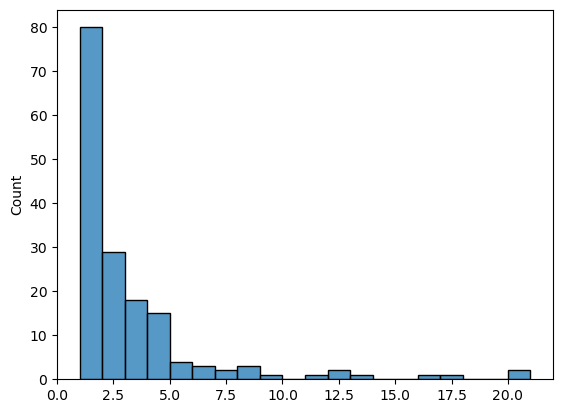

In [ ]:
sns.histplot(institution_authors_by_work_distribution['OpenAI'], binwidth=1, log_scale=(False, False))

<Axes: ylabel='Count'>

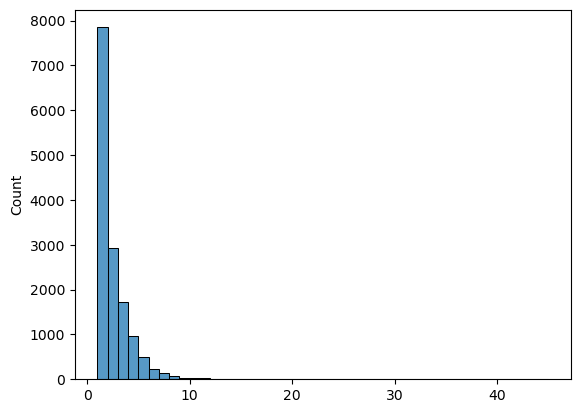

In [ ]:
sns.histplot(institution_authors_by_work_distribution['Microsoft'], binwidth=1, log_scale=(False, False))

<Axes: ylabel='Count'>

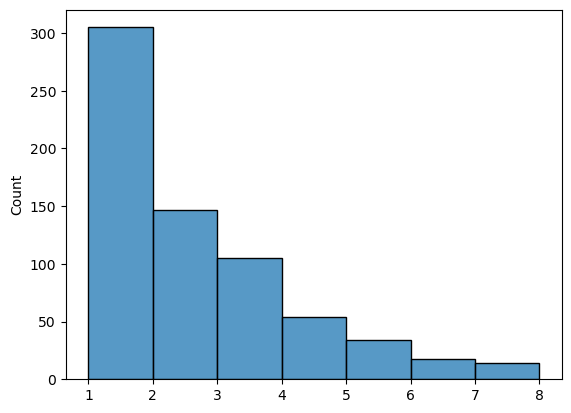

In [ ]:
sns.histplot(institution_authors_by_work_distribution['SenseTime'], binwidth=1, log_scale=(False, False))

In [ ]:
authors_by_work_distribution = []
for ins, authors_by_work in institution_authors_by_work.items():
    for work_id, author_ids in authors_by_work.items():
        authors_by_work_distribution.append(len(author_ids))
        if len(author_ids) > 50:
            print(work_id)
authors_by_work_distribution = np.array(authors_by_work_distribution)
authors_by_work_distribution.mean()

https://openalex.org/W3197720002
https://openalex.org/W4309233013
https://openalex.org/W4309303298
https://openalex.org/W4362552012
https://openalex.org/W3187235458
https://openalex.org/W3137554059
https://openalex.org/W2193413348


2.2475730274935595

# Works in common

In [ ]:
institution_works = {ins:set(authors_by_work.keys()) for ins, authors_by_work in institution_authors_by_work.items()}
institution_works

{'Meta': {'https://openalex.org/W3206861115',
  'https://openalex.org/W3136429794',
  'https://openalex.org/W3104485462',
  'https://openalex.org/W2966237800',
  'https://openalex.org/W2594305427',
  'https://openalex.org/W3093516620',
  'https://openalex.org/W3048921023',
  'https://openalex.org/W3158278463',
  'https://openalex.org/W3159377503',
  'https://openalex.org/W3090938911',
  'https://openalex.org/W2170762633',
  'https://openalex.org/W2890123813',
  'https://openalex.org/W2963023085',
  'https://openalex.org/W3127801943',
  'https://openalex.org/W3197921177',
  'https://openalex.org/W2962872506',
  'https://openalex.org/W3138037053',
  'https://openalex.org/W3173716560',
  'https://openalex.org/W2770312844',
  'https://openalex.org/W2995752452',
  'https://openalex.org/W3127108316',
  'https://openalex.org/W3034410824',
  'https://openalex.org/W2558748708',
  'https://openalex.org/W2045631398',
  'https://openalex.org/W2134355050',
  'https://openalex.org/W3099700870',
  'h

In [ ]:
num_works_collab = 0
num_ins_collab = []
for i, work in enumerate(works):
    num_ins = 0
    for ins, ins_works in institution_works.items():
        if work['id'] in ins_works:
            num_ins += 1
    if num_ins > 1:
        num_works_collab += 1
        num_ins_collab.append(num_ins)

In [ ]:
num_works_collab

2390

In [ ]:
num_works_collab / len(works)

0.03611635814129203

In [ ]:
num_ins_collab = np.array(num_ins_collab)
num_ins_collab.mean()

2.0623430962343097

In [ ]:
len(num_ins_collab[num_ins_collab > 2]) / len(num_ins_collab)

0.05481171548117155

In [ ]:
num_works_in_common = np.zeros((len(institution_works)-2, len(institution_works)-2))
proportion_works_in_common = np.zeros((len(institution_works)-2, len(institution_works)-2))
labels = []
i = 0
for ins in sorted(institution_works.keys()):
    j = 0
    if ins in ['Quansight', 'Enthought']:
        continue
    labels.append(ins)
    for other_ins in sorted(institution_works.keys()):
        if other_ins in ['Quansight', 'Enthought']:
            continue
        if ins == other_ins:
            j += 1
            continue
        ins_works = institution_works[ins]
        other_ins_works = institution_works[other_ins]
        num_works_in_common[i, j] = len(ins_works.intersection(other_ins_works))
        proportion_works_in_common[i, j] = len(ins_works.intersection(other_ins_works)) / len(ins_works)
        j += 1
    i += 1

In [ ]:
proportion_works_in_common

array([[0.00000000e+00, 8.56531049e-04, 4.28265525e-03, 2.56959315e-03,
        2.56959315e-03, 3.21199143e-02, 4.28265525e-04, 5.99571734e-03,
        1.54175589e-02, 1.15631692e-02, 1.49892934e-02, 1.71306210e-03,
        4.28265525e-04, 1.28479657e-03, 3.85438972e-03, 4.28265525e-04,
        1.28479657e-03, 8.56531049e-04, 3.42612420e-03, 4.28265525e-04,
        8.56531049e-04, 8.56531049e-04, 0.00000000e+00],
       [5.84112150e-04, 0.00000000e+00, 3.79672897e-03, 4.96495327e-03,
        0.00000000e+00, 2.04439252e-03, 6.13317757e-03, 3.50467290e-03,
        2.92056075e-03, 1.16822430e-03, 1.51869159e-02, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 2.92056075e-04, 0.00000000e+00,
        2.92056075e-04, 0.00000000e+00, 8.46962617e-03, 5.84112150e-04,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [3.37609723e-03, 4.38892640e-03, 0.00000000e+00, 3.03848751e-03,
        2.02565834e-03, 2.97096556e-02, 3.71370695e-03, 1.41796084e-02,
        2.70087779e-03

In [ ]:
for i, label in enumerate(labels):
    print(label, proportion_works_in_common[:, i].sum())

Adobe 0.11109178452342516
Alibaba 0.04668788089230464
Amazon 0.17916156412605272
Baidu 0.052179593834187285
DeepMind 0.0625134935264797
Google 0.8340140229696291
Huawei 0.07277922809876411
IBM 0.12887847094564814
Intel 0.11379530007627858
Meta 0.2538012904572727
Microsoft 0.4278818550093094
NEC 0.011341124430683112
Naver 0.021048959480268678
Netflix 0.021840514099101344
Nvidia 0.08517153707019512
OpenAI 0.029105093510353987
Salesforce 0.023772515782222628
SenseTime 0.01587019085311766
Tencent 0.0851027706344045
Twitter 0.03609392577887626
Uber 0.04573995966206034
Xerox 0.016772021522646962
Yandex 0.0031797034555967924


In [ ]:
proportion_works_in_common.mean(axis=1).mean() * 100

0.5062046882304119

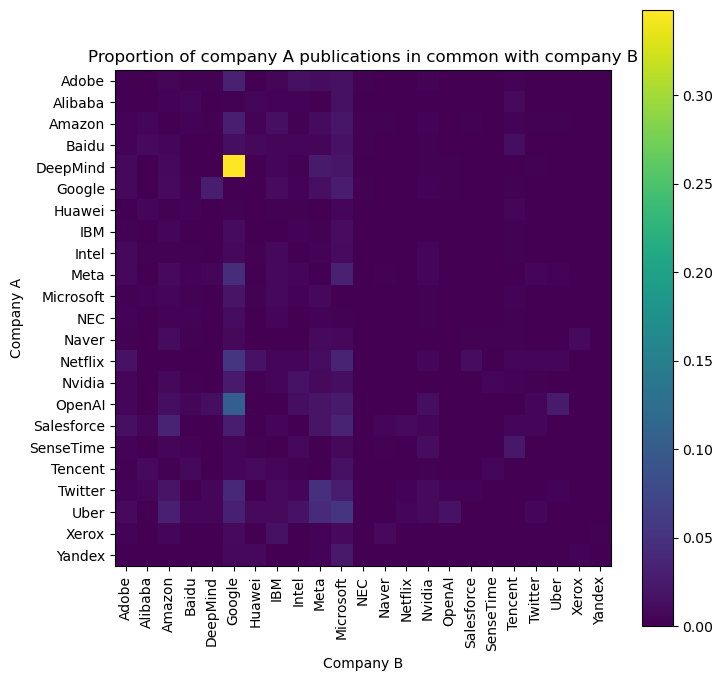

In [ ]:
# Create a heatmap
plt.imshow(proportion_works_in_common, cmap='viridis', interpolation='nearest')

# Add colorbar
plt.colorbar()

# Label axes
plt.xticks(ticks=range(len(labels)), labels=labels, rotation=90)
plt.yticks(ticks=range(len(labels)), labels=labels)

# Add title and labels
plt.title('Proportion of company A publications in common with company B')
plt.xlabel('Company B')
plt.ylabel('Company A')

# Resize plot
plt.gcf().set_size_inches(8, 8)

# Show plot
plt.show()